# Title: HDIP_DViz_CA1
#### Module: Data Visualization
- Student Name: Eoin Cantwell
- Student Number: sba21230
- Submission Date: 29/10/2021

# Assignment Brief

###### - I am an employee of a retail company and it is my job to analyse the following dataset "board_games.csv" which is based on board games. This analysis will help determine the sales strategy for the company I work for in their upcoming Winter season.


###### - All questions will be answered using separate visualizations that will uncover helpful insights.


###### - All decisions in this report will be rationalized in order to evidence and prove to The Chief Technology Officer (CTO) why a certain decision and outcome was made/reached.


###### - The rationalization includes the visualization of design decisions, how the data was engineered, feature selection and any other information that is relevant.

# Imports

> Importing in the required libraries to allow the data to be read into python. These functions are the tools that allow the data to be manipulated and analysed.

In [1]:
import pandas                    as pd
import seaborn                   as sns
sns.set_style("darkgrid")
import matplotlib.pyplot         as plt
import numpy                     as np
import inflection
import pandas_datareader.data    as web
import plotly.express            as px
import plotly.graph_objects      as go
import warnings
warnings.filterwarnings("ignore")


from IPython.display            import Image
from IPython.core.display       import HTML
from sklearn                    import preprocessing   as pp

from sklearn.datasets           import load_digits
from sklearn.decomposition      import PCA
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Helper Functions

> Functions used to change the screen sizing of the notebook and enhance plots.

In [2]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()

jupyter_settings();

Populating the interactive namespace from numpy and matplotlib


## Loading the Data
> Reading in the data set from where it is stored on my PC by creating a dataframe called raw_df. The data is housed in a .csv file (comma separated values).

In [3]:
raw_df = pd.read_csv("data/board_games.csv")

>raw_df.head() shows us the first 5 rows, this can be increased by inserting a number inside the brackets.

In [4]:
raw_df.head()

,game_id,description,image,max_players,max_playtime,min_age,min_players,min_playtime,name,playing_time,thumbnail,year_published,artist,category,compilation,designer,expansion,family,mechanic,publisher,average_rating,users_rated
0,1,Die Macher is a game about seven sequential po...,//cf.geekdo-images.com/images/pic159509.jpg,5,240,14,3,240,Die Macher,240,//cf.geekdo-images.com/images/pic159509_t.jpg,1986,Marcus Gschwendtner,"Economic,Negotiation,Political",NaN,Karl-Heinz Schmiel,NaN,"Country: Germany,Valley Games Classic Line","Area Control / Area Influence,Auction/Bidding,...","Hans im Glück Verlags-GmbH,Moskito Spiele,Vall...",7.66508,4498
1,2,Dragonmaster is a trick-taking card game based...,//cf.geekdo-images.com/images/pic184174.jpg,4,30,12,3,30,Dragonmaster,30,//cf.geekdo-images.com/images/pic184174_t.jpg,1981,Bob Pepper,"Card Game,Fantasy",NaN,"G. W. ""Jerry"" D'Arcey",NaN,Animals: Dragons,Trick-taking,"E.S. Lowe,Milton Bradley",6.60815,478
2,3,"Part of the Knizia tile-laying trilogy, Samura...",//cf.geekdo-images.com/images/pic3211873.jpg,4,60,10,2,30,Samurai,60,//cf.geekdo-images.com/images/pic3211873_t.jpg,1998,Franz Vohwinkel,"Abstract Strategy,Medieval",NaN,Reiner Knizia,NaN,"Asian Theme,Country: Japan,Knizia tile-laying ...","Area Control / Area Influence,Hand Management,...","999 Games,ABACUSSPIELE,Astrel Games,Ceilikan J...",7.44119,12019
3,4,When you see the triangular box and the luxuri...,//cf.geekdo-images.com/images/pic285299.jpg,4,60,12,2,60,Tal der Könige,60,//cf.geekdo-images.com/images/pic285299_t.jpg,1992,NaN,Ancient,NaN,Christian Beierer,NaN,"Country: Egypt,Promotional Board Games","Action Point Allowance System,Area Control / A...",KOSMOS,6.60675,314
4,5,"In Acquire, each player strategically invests ...",//cf.geekdo-images.com/images/pic342163.jpg,6,90,12,3,90,Acquire,90,//cf.geekdo-images.com/images/pic342163_t.jpg,1964,"Scott Okumura,Peter Whitley",Economic,NaN,Sid Sackson,NaN,3M Bookshelf Series,"Hand Management,Stock Holding,Tile Placement","3M,Avalon Hill,Avalon Hill (Hasbro),Dujardin,G...",7.35830,15195


>raw_df.tail() shows us the last 5 rows, this can be increased by inserting a number inside the brackets.

In [5]:
raw_df.tail()

,game_id,description,image,max_players,max_playtime,min_age,min_players,min_playtime,name,playing_time,thumbnail,year_published,artist,category,compilation,designer,expansion,family,mechanic,publisher,average_rating,users_rated
10527,214996,Description from the publisher:&#10;&#10;Silve...,//cf.geekdo-images.com/images/pic3093082.png,2,480,12,1,30,"Silver Bayonet: The First Team in Vietnam, 196...",480,//cf.geekdo-images.com/images/pic3093082_t.png,2016,Charles Kibler,"Vietnam War,Wargame",NaN,"Gene Billingsley,Mitchell Land",NaN,GMT Operational System,Hex-and-Counter,GMT Games,8.35333,75
10528,215437,"Codex: Card-Time Strategy is a customizable, n...",//cf.geekdo-images.com/images/pic3290122.jpg,5,45,13,2,45,Codex: Card-Time Strategy – Core Set,45,//cf.geekdo-images.com/images/pic3290122_t.jpg,2016,NaN,"Card Game,Fantasy,Fighting,Video Game Theme",NaN,David Sirlin,Codex: Card-Time Strategy – Flagstone Dominion...,Fantasy Strike,"Deck / Pool Building,Hand Management,Variable ...",Sirlin Games,8.08780,82
10529,215471,Time to walk about town and take some pictures...,//cf.geekdo-images.com/images/pic3290975.png,4,20,12,2,20,Wind the Film!,20,//cf.geekdo-images.com/images/pic3290975_t.png,2016,宝井 貴子 (Takako Takarai),Card Game,NaN,Saashi,NaN,NaN,"Hand Management,Set Collection",Saashi & Saashi,7.28016,63
10530,216201,The race is on for the robots of the Robo Rall...,//cf.geekdo-images.com/images/pic3374227.jpg,6,120,12,2,20,Robo Rally (2016),120,//cf.geekdo-images.com/images/pic3374227_t.jpg,2016,NaN,"Miniatures,Racing,Science Fiction",NaN,Richard Garfield,NaN,Robots,"Action / Movement Programming,Grid Movement,Mo...","Avalon Hill (Hasbro),Hasbro",7.45871,341
10531,216725,The deluxe edition comes in a double tall box ...,//cf.geekdo-images.com/images/pic3308211.jpg,5,60,14,1,30,Villages of Valeria: Deluxe Kickstarter Edition,60,//cf.geekdo-images.com/images/pic3308211_t.jpg,2016,Mihajlo Dimitrievski,"Card Game,City Building","Villages of Valeria,Villages of Valeria: Bard ...","Rick Holzgrafe,Isaias Vallejo",NaN,"Crowdfunding: Kickstarter,Tableau Building","Card Drafting,Hand Management",Daily Magic Games,7.52941,119


# Data Description

## Data Dictionary
> A data dictionary is a practical depiction of the metadata connected with a data object, such as a database, table, or column (Octopai, 2019).The data dictionary helps give an understanding as to what each feature means and is very useful at the start of any data analysis project, for both the user and any person using/reading the data at a later date.

|Feature                         | Description
|:---------------------------|:---------------
|**game_id**                        | Unique game identifier |
|**description**                        | A paragraph of text describing the game | 
|**image**                    | URL image of the game  | 
|**max_players**                        | Maximum recommended players   | 
|**max_playtime**                       | Maximum recommended playtime (min) | 
|**min_age**                   | Minimum recommended age | 
|**min_players**        | Minimum recommended players | 
|**min_playtime**              | Minimum recommended playtime (min)  |
|**name**              | Name of the game|
|**playing_time**                 | Average playtime |
|**thumbnail**                | URL thumbnail of the game |
|**year_published**          |Year game was published |
|**artist**                  |Artist for game art |
|**category**                |Categories for game (separated by commas)|
|**compilation**            |If part of a multi-compilation-name of compilation|
|**designer**                |Game designer|
|**expansion**               |If there is an expansion pack - name of expansion|            
|**family**                  |Family of game - equivalent to publisher|
|**mechanic**               |Game mechanic - how game is played, separated by comma|
|**publisher**              |Company/person who published the game, separated by comma|
|**average_rating**          |Average rating on Board Games Geek (1-10)|
|**users_rated**             |Number of users that rated the game|

## Renaming of Columns
> In my view, there is no requirement to rename the column names as they are in the appropriate format as is, that is all the feature names are all in lower case and have the snake case applied.

## Shape of Data
>raw_df.shape reveals the dimensions of the dataframe. Ultimately it shows the number of observations and features the dataset possesses.

In [6]:
raw_df.shape

(10532, 22)

## Data Types
>raw_df.dtypes shows what the data types are for each variable/feature in the dataset.

In [7]:
raw_df.dtypes

game_id             int64
description        object
image              object
max_players         int64
max_playtime        int64
min_age             int64
min_players         int64
min_playtime        int64
name               object
playing_time        int64
thumbnail          object
year_published      int64
artist             object
category           object
compilation        object
designer           object
expansion          object
family             object
mechanic           object
publisher          object
average_rating    float64
users_rated         int64
dtype: object

## Data Makeup
>raw_df.info() reveals important insights about the data in the dataset. Useful insights such as what data types are the variables, the count of each variable, the number of columns/variables there are and the memory usage the dataset is placing on the laptops harddrive.

In [8]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10532 entries, 0 to 10531
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   game_id         10532 non-null  int64  
 1   description     10532 non-null  object 
 2   image           10531 non-null  object 
 3   max_players     10532 non-null  int64  
 4   max_playtime    10532 non-null  int64  
 5   min_age         10532 non-null  int64  
 6   min_players     10532 non-null  int64  
 7   min_playtime    10532 non-null  int64  
 8   name            10532 non-null  object 
 9   playing_time    10532 non-null  int64  
 10  thumbnail       10531 non-null  object 
 11  year_published  10532 non-null  int64  
 12  artist          7759 non-null   object 
 13  category        10438 non-null  object 
 14  compilation     410 non-null    object 
 15  designer        10406 non-null  object 
 16  expansion       2752 non-null   object 
 17  family          7724 non-null  

## Null Values Check
>raw_df.isnull().sum() helps us to investigate if there are any null values present.

In [9]:
raw_df.isnull().sum()

game_id               0
description           0
image                 1
max_players           0
max_playtime          0
min_age               0
min_players           0
min_playtime          0
name                  0
playing_time          0
thumbnail             1
year_published        0
artist             2773
category             94
compilation       10122
designer            126
expansion          7780
family             2808
mechanic            950
publisher             3
average_rating        0
users_rated           0
dtype: int64

## Handling Null Values
>The following piece of code helps to drop the null values and this is an important step that will help the analysis down the line.

In [10]:
raw_df.dropna(subset=['artist', 'category', 'designer', 'mechanic', 'publisher'], inplace=True)

## Checking if Null Values were dropped
>raw_df.isnull().sum() confirms whether all the null values have been dropped or not. 

In [11]:
raw_df.isnull().sum()

game_id              0
description          0
image                1
max_players          0
max_playtime         0
min_age              0
min_players          0
min_playtime         0
name                 0
playing_time         0
thumbnail            1
year_published       0
artist               0
category             0
compilation       6823
designer             0
expansion         4900
family            1755
mechanic             0
publisher            0
average_rating       0
users_rated          0
dtype: int64

## Duplicates Check
>Checking for duplicated data in the next lines of code.

In [12]:
duplicates = raw_df.duplicated()
print(duplicates.sum())
raw_df[duplicates]

0


,game_id,description,image,max_players,max_playtime,min_age,min_players,min_playtime,name,playing_time,thumbnail,year_published,artist,category,compilation,designer,expansion,family,mechanic,publisher,average_rating,users_rated


## Analysts Strategy
> I am removing certain features for a few reasons. This is due to certain variables either having a large chunk of null values or some variables offering no value as per the project brief in mind, as an analyst, one must make decisive decisions to focus the approach and limit the resources used to uncover the key information. In my opinion, by examining the project brief and the objectives of same, there is no requirement to keep the following variables; "image", "thumbnail", "compilation", "expansion", "artist", "family", "designer".

##### The reasons behind this are as follows:

- Aesthetics
- Easier to work with the data
- No use for the variables in question. Personally and in my experience talking to friends and family, nobody is interested in the "designer", "artist", "family" of a board game. Therefore I concluded that such data is not necessary to carry forward.

## Dropping columns

In [13]:
raw_df = raw_df.drop(["image", "thumbnail", "compilation", "expansion", "artist", "family", "designer"], axis=1)
raw_df.head(5)

,game_id,description,max_players,max_playtime,min_age,min_players,min_playtime,name,playing_time,year_published,category,mechanic,publisher,average_rating,users_rated
0,1,Die Macher is a game about seven sequential po...,5,240,14,3,240,Die Macher,240,1986,"Economic,Negotiation,Political","Area Control / Area Influence,Auction/Bidding,...","Hans im Glück Verlags-GmbH,Moskito Spiele,Vall...",7.66508,4498
1,2,Dragonmaster is a trick-taking card game based...,4,30,12,3,30,Dragonmaster,30,1981,"Card Game,Fantasy",Trick-taking,"E.S. Lowe,Milton Bradley",6.60815,478
2,3,"Part of the Knizia tile-laying trilogy, Samura...",4,60,10,2,30,Samurai,60,1998,"Abstract Strategy,Medieval","Area Control / Area Influence,Hand Management,...","999 Games,ABACUSSPIELE,Astrel Games,Ceilikan J...",7.44119,12019
4,5,"In Acquire, each player strategically invests ...",6,90,12,3,90,Acquire,90,1964,Economic,"Hand Management,Stock Holding,Tile Placement","3M,Avalon Hill,Avalon Hill (Hasbro),Dujardin,G...",7.35830,15195
5,6,"In the ancient lands along the Mediterranean, ...",6,240,12,2,240,Mare Mediterraneum,240,1989,"Civilization,Nautical",Dice Rolling,Historien Spiele Galerie (Historien Spielegale...,6.52534,73


## New dataframe
> Here I am making a copy of the raw data and I am doing so by creating a new dataframe to house this.

In [14]:
df_1 = raw_df.copy()

## Descriptive Statistics

> Descriptive Statistics is used next, this will help me to better understand the data. I will start by splitting data between numerical and categorical attributes. Numerical features will be the ones which type is equal to 'int64' and 'float64'. Categorical features will be all other than 'int64', 'float64', and 'datetime64'.

> The study of both Numerical and Categorical attributes helps to provide a short analysis of the features. This study will help me to understand the scope and needs to prepare for future steps, such as Exploratory Data Analysis (EDA).

###### Splitting the data into numerical and categorical features

In [15]:
num_attributes = df_1.select_dtypes( include=['int64', 'float64'])

### Numerical Attributes

> Here I am using .T in order to transpose the attribute to array. The central tendency such as mean, median among others will be looked at.

> The below code will help reveal the dispersion of the data - standard deviation (std), minimum (min), maximum (max), range, skew, kurtosis

> The last line of code uses pd.concat which merges the dataframes together and shows them in a nice table.

In [16]:
ct1 = pd.DataFrame( num_attributes.apply( np.mean ) ).T
ct2 = pd.DataFrame( num_attributes.apply( np.median ) ).T


d1 = pd.DataFrame( num_attributes.apply( np.std ) ).T
d2 = pd.DataFrame( num_attributes.apply( min ) ).T
d3 = pd.DataFrame( num_attributes.apply( max ) ).T
d4 = pd.DataFrame( num_attributes.apply( lambda x: x.max() - x.min() ) ).T
d5 = pd.DataFrame( num_attributes.apply( lambda x: x.skew() ) ).T
d6 = pd.DataFrame( num_attributes.apply( lambda x: x.kurtosis() ) ).T


m_dfs = pd.concat( [d2, d3, d4, ct1, ct2, d1, d5, d6] ).T.reset_index()
m_dfs.columns = ['attributes','min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis']
m_dfs



,attributes,min,max,range,mean,median,std,skew,kurtosis
0,game_id,1.0000,216725.00000,216724.00000,69770.367921,38904.0000,67163.036660,0.535131,-1.261136
1,max_players,0.0000,362.00000,362.00000,5.038736,4.0000,7.474660,22.080728,807.128103
2,max_playtime,0.0000,60000.00000,60000.00000,104.344288,45.0000,786.167196,64.228178,4753.660735
3,min_age,0.0000,25.00000,25.00000,9.994267,10.0000,3.260017,-1.234563,2.178059
4,min_players,0.0000,9.00000,9.00000,2.058314,2.0000,0.671730,1.938668,13.286228
5,min_playtime,0.0000,60000.00000,60000.00000,90.235911,45.0000,759.543381,70.505661,5451.635745
6,playing_time,0.0000,60000.00000,60000.00000,104.344288,45.0000,786.167196,64.228178,4753.660735
7,year_published,1951.0000,2016.00000,65.00000,2004.751503,2009.0000,11.336881,-1.475366,1.795357
8,average_rating,2.3394,9.00392,6.66452,6.549940,6.5491,0.771385,-0.216806,0.395529
9,users_rated,50.0000,67655.00000,67605.00000,1157.467487,237.0000,3433.120577,8.610194,108.147505


### Categorical Attributes

In [17]:
df_1.describe(include=object)

,description,name,category,mechanic,publisher
count,7151,7151,7151,7151,7151
unique,7149,7074,2919,2773,3981
top,The award winning game Orcs Must Die has made ...,Cosmic Encounter,"Wargame,World War II",Hex-and-Counter,GMT Games
freq,2,4,349,394,177


# Exploratory Data Analysis

## Distribution of numerical data
> Similar to the pairwise plot, using the histogram to show how the data is distrubted is a very useful insight to get.

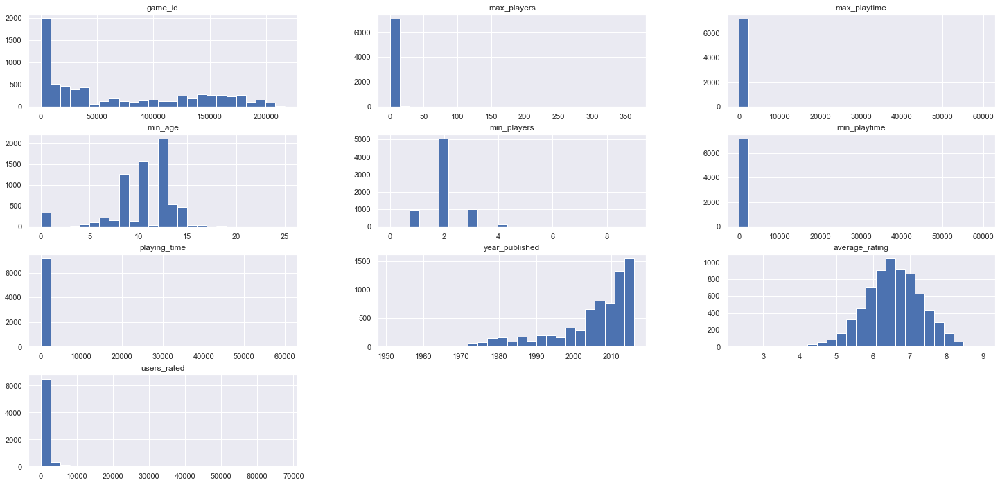

In [18]:
num_attributes.hist( bins=25 );

## Data Relationships
> A basic correlogram is formed using the below sns.pairplot(df_1) code, the data is plotted using a scatter plot for each variable/feature. This shows the overall distribution and shape of the data individually and relationship each has to one and another. It is a high level overview of the distribution of the data one is working with.

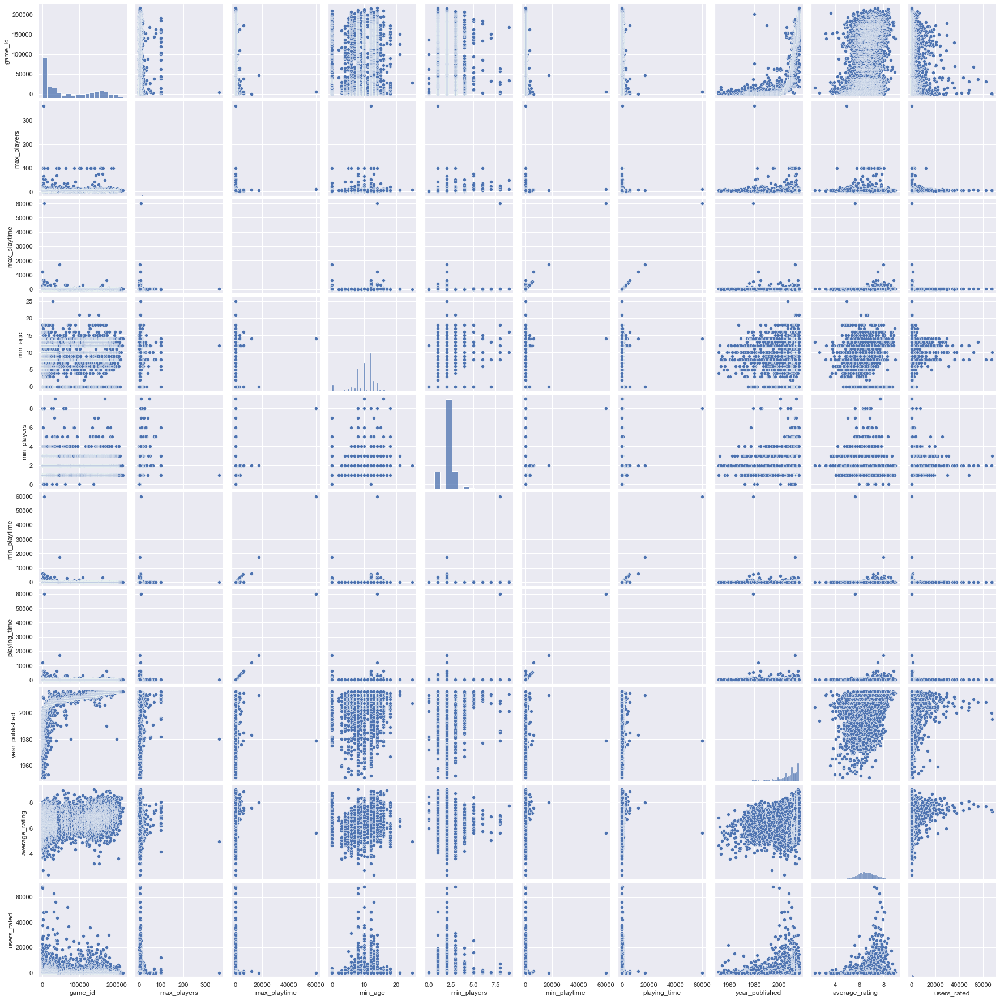

In [19]:
sns.pairplot(df_1)

## Correlation Matrix
> A correlation matrix is very useful to reveal any relationships among the variables. The following code sets the range of values to be displayed on the colormap from -1 to 1. 
Moreover the second line gives a title to the heatmap. The pad defines the distance of the title from the top of the heatmap.

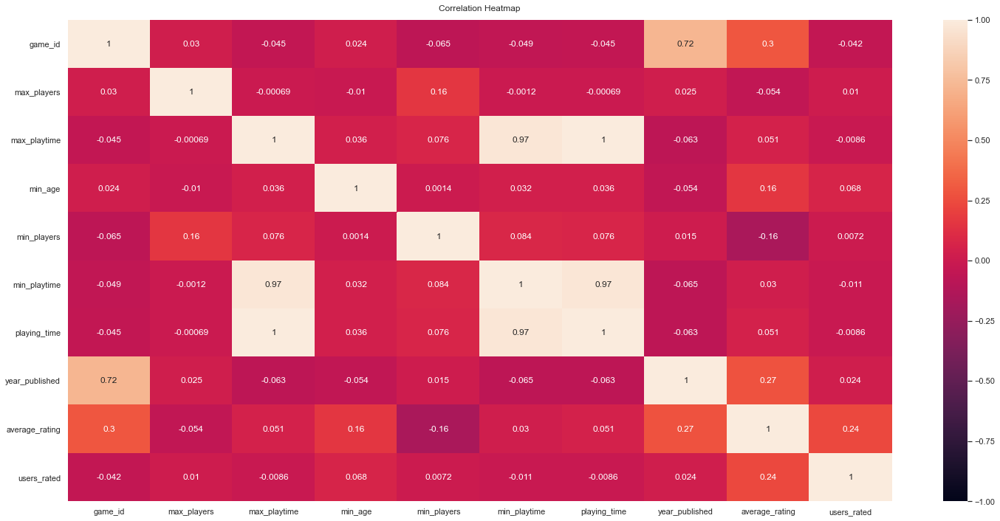

In [20]:
heatmap = sns.heatmap(df_1.corr(), vmin=-1, vmax=1, annot=True)

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

## Text Analysis - High Level
> Here I installed wordcloud which is a python program that generates a wordcloud showing the most common words within the text columns in the dataframe. In order to install this I used - ! pip install wordcloud. Uncovering such information is not highly informative but it does give an incline into what words are used the most and most associated with board games.

###### Wordcloud of the variable "mechanic" and its text

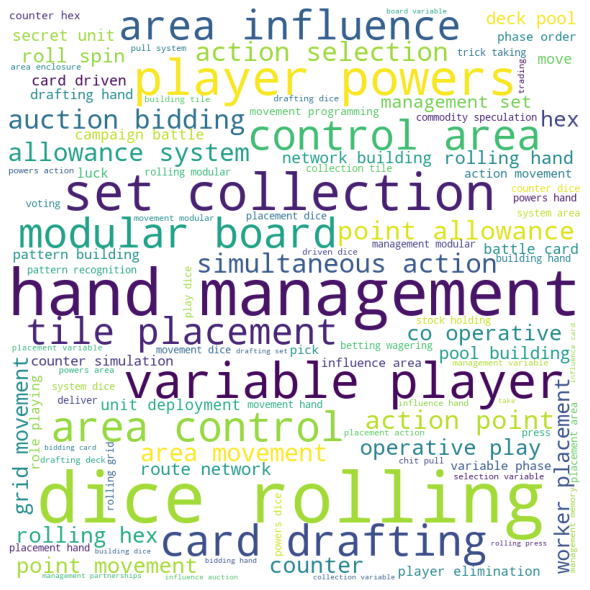

In [21]:
comment_words = ''
stopwords = set(STOPWORDS)
 
# iterate through the csv file
for val in df_1.mechanic:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

###### Wordcloud of the variable "category" and its text

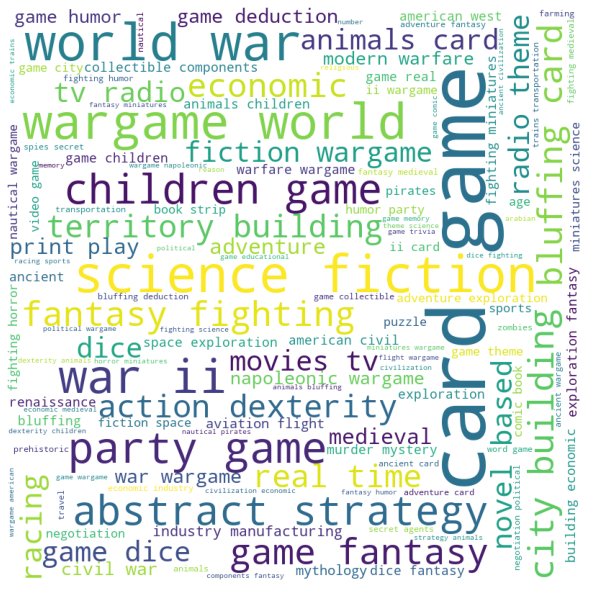

In [22]:
comment_words = ''
stopwords = set(STOPWORDS)
 
# iterate through the csv file
for val in df_1.category:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

###### Wordcloud of the variable "description" and its text

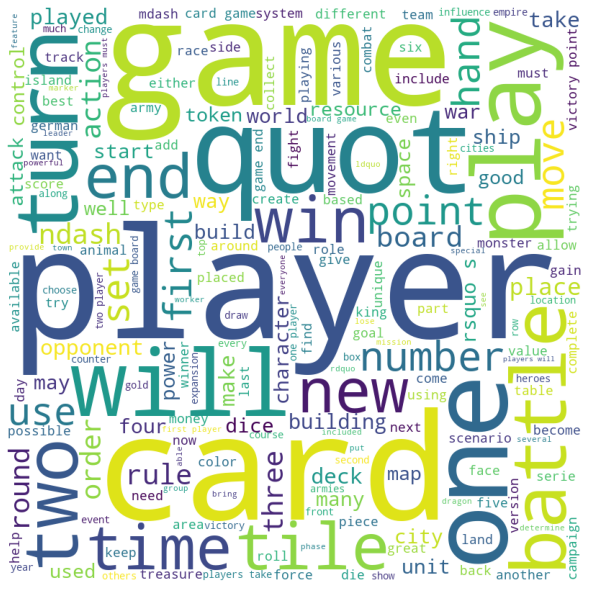

In [23]:
comment_words = ''
stopwords = set(STOPWORDS)
 
# iterate through the csv file
for val in df_1.description:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

# Feature Engineering
>Feature engineering is the initial stage in a machine learning channel and it comprises of all the techniques utilised to clean existing datasets. It improves their signal-noise ratio, and reduces their dimensionality (Bonaccorso, 2017). 

## Outlier Detection and Handling

> Firstly a list is created for columns with numeric variables present, this assists the whisker plot generation.

In [24]:
column_list = ['game_id', 'max_players', 'max_playtime','min_age', 'min_players', 'min_playtime', 'playing_time', 'year_published', 'average_rating', 'users_rated']

### Whisker Plots
> Using whisker plots for all columns with numeric variables present to detect the presence of any outliers

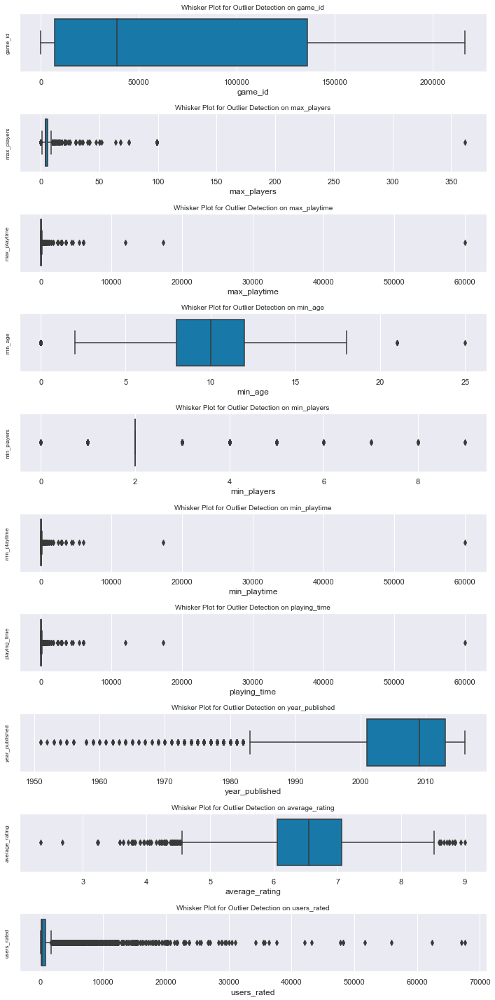

In [25]:
fig, ax = plt.subplots (len(column_list), figsize = (10, 20))

for i, col_list in enumerate(column_list):
    sns.boxplot(df_1[col_list], ax = ax[i], palette = "winter", orient = 'h')
    ax[i].set_title("Whisker Plot for Outlier Detection on" + " " + col_list, fontsize = 10)
    ax[i].set_ylabel(col_list, fontsize = 8)
    fig.tight_layout(pad = 1.1)

## Scaling of the DATA

##### Min Max Scaler
>Rescaling is a common pre-processing task in machine learning where it places all features on the same scale, typically 0 to 1 or –1 to 1. There are a number of rescaling techniques, but one of the simplest is min-max scaling. Min-max scaling uses the minimum and maximum values of a feature to rescale values to within a range.

>Robust Scaler was used to help with outliers.

In [26]:
df2 = df_1.copy()

In [27]:
#Min Max
mms = pp.MinMaxScaler()

df2['game_id'] = mms.fit_transform( df2[['game_id']].values )
df2['max_players'] = mms.fit_transform( df2[['max_players']].values )
df2['max_playtime'] = mms.fit_transform( df2[['max_playtime']].values )
df2['min_age'] = mms.fit_transform( df2[['min_age']].values )
df2['min_playtime'] = mms.fit_transform( df2[['min_playtime']].values )
df2['playing_time'] = mms.fit_transform( df2[['playing_time']].values )
df2['users_rated'] = mms.fit_transform( df2[['users_rated']].values )

### Robust Scaler

In [28]:
df2_1 = df2[['max_players', 'max_playtime','min_age', 'min_players', 'min_playtime', 'playing_time', 'average_rating', 'users_rated']]

In [29]:
from sklearn.preprocessing import RobustScaler
rs = RobustScaler()
rs = RobustScaler().fit(df2_1)


df2_1['max_players'] = rs.fit_transform( df2_1[['max_players']].values )
df2_1['max_playtime'] = rs.fit_transform( df2_1[['max_playtime']].values )
df2_1['min_age'] = rs.fit_transform( df2_1[['min_age']].values )
df2_1['min_playtime'] = rs.fit_transform( df2_1[['min_playtime']].values )
df2_1['playing_time'] = rs.fit_transform( df2_1[['playing_time']].values )
df2_1['users_rated'] = rs.fit_transform( df2_1[['users_rated']].values )

transformer = RobustScaler().fit(df2_1)
transformer
RobustScaler(df2_1)
transformer.transform(df2_1)

array([[ 0.5       ,  3.25      ,  1.        , ...,  3.25      ,
         1.10910907,  6.43655589],
       [ 0.        , -0.25      ,  0.5       , ..., -0.25      ,
         0.05868644,  0.36404834],
       [ 0.        ,  0.25      ,  0.        , ...,  0.25      ,
         0.88659753, 17.79758308],
       ...,
       [-1.        ,  7.25      ,  0.5       , ...,  7.25      ,
         1.79312161, -0.24471299],
       [ 0.        , -0.41666667,  0.5       , ..., -0.41666667,
         0.72655897, -0.26283988],
       [ 0.5       ,  0.25      ,  1.        , ...,  0.25      ,
         0.97427437, -0.17824773]])

# Assignment Brief

# Part 1


## 1.A) What are the top 5 “average rated” games? 


> The below code produces the top 5 average_rated games and keeps it in a new dataframe called df_top5

In [30]:
df_top5 = df2.nlargest(5, ['average_rating'])

> Next I reveal the top 5 average rated board games by placing the results from the above line of code into a table.

In [31]:
results_tp = df_top5.groupby(['name'])['average_rating'].sum().sort_values(ascending=False)
results_tp = results_tp.to_frame().reset_index()
results_tp

,name,average_rating
0,Small World Designer Edition,9.00392
1,Kingdom Death: Monster,8.93184
2,Terra Mystica: Big Box,8.84862
3,Last Chance for Victory,8.84603
4,"The Greatest Day: Sword, Juno, and Gold Beaches",8.83081


>The top 5 average rated games are as follows; 1) Small World Designer Edition, 2) Kingdom Death: Monster, 3) Terra Mystica: Big Box, 4) Last Chance for Victory and 5) The Greatest Day: Sword, Juno and Gold Beaches

>The following code produces a countplot and this visually shows the top 5 average rated games, all of which are very close to each other, as seen in the above table.

>The barplot is a very simple and easy graph to use. The colours chosen are bright and vibrant and display the differences between games nicely. The font colour and size are kept to the standard as it is best to keep them from taking away from the overal visual and impeding in on the bars.

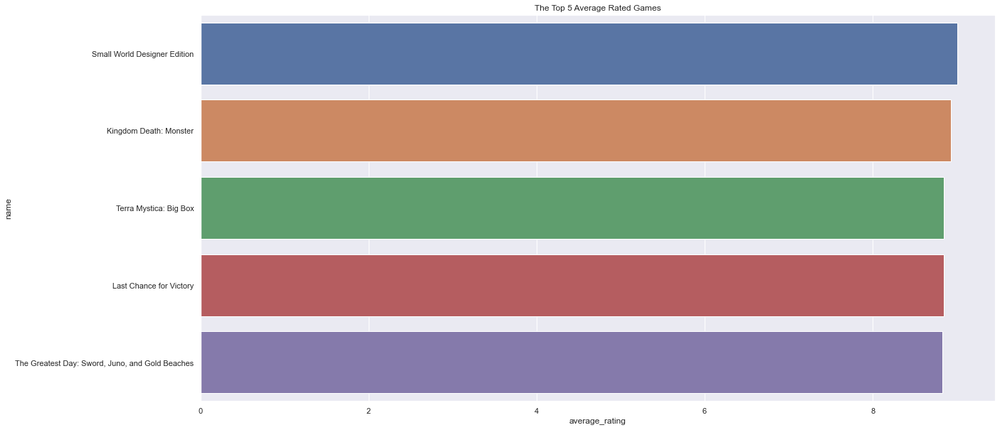

In [32]:
plt.figure(figsize=(20,10))
sns.barplot(x='average_rating',y='name', data=results_tp)
plt.title("The Top 5 Average Rated Games")
plt.show()

> I decided to search for the top three average rated games and have uploaded an image of the actual board the game is played on and its pieces, to provide an insight as to what the board games look like. 

#### No1 Average Rated Game - "Small World Designer"

In [33]:
im = Image.open('small-world-designer-edition.jpg')

#### No2 Average Rated Game - "Kingdom Death Monster"

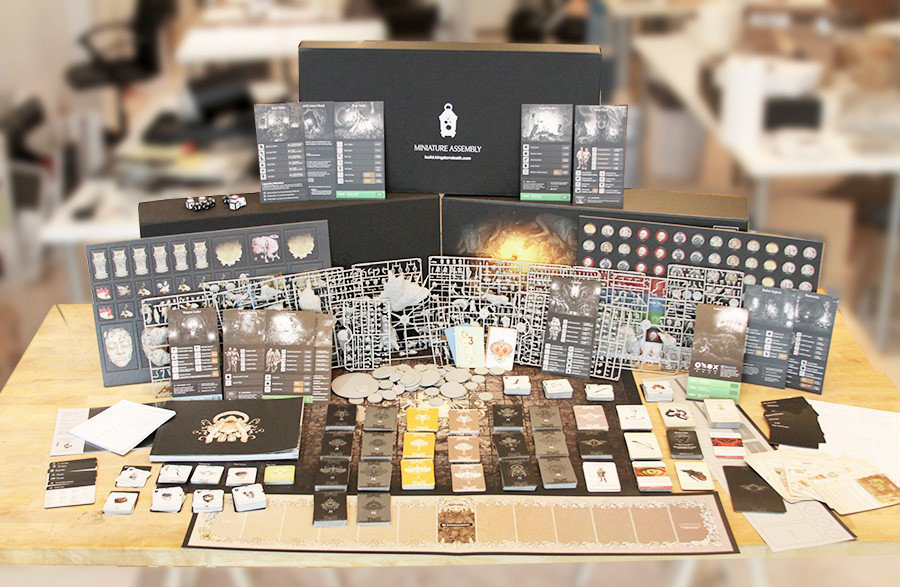

In [34]:
Image.open('Kingdom Death Monster.jpg')

#### No3 Average Rated Game - "Terra Mystica Big Box"

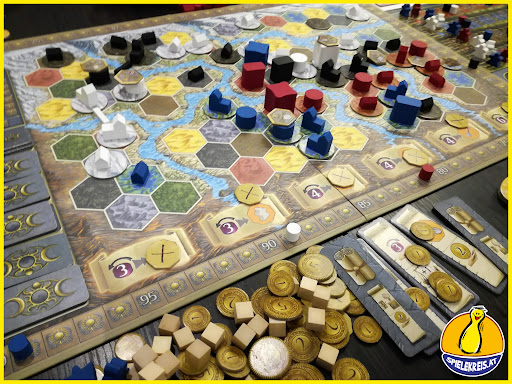

In [35]:
Image.open('Terra Mystica Big Box.jpg')

## 1.B) Is there a correlation between the variables “users_rated” and the “max_playtime”?

#### Pearsons Coefficient - this will provide an initial basis to work from and will help determine if there is a correlation evident

In [36]:
from scipy.stats import pearsonr
# Convert dataframe into series
list1 = df2['users_rated']
list2 = df2['max_playtime']
  
# Apply the pearsonr()
corr, _ = pearsonr(list1, list2)
print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: -0.009


> The correlation coefficient or Pearson's r, is a measure of both the strength and direction of the linear relationship between two variables. The statistic will be a number between -1 and 1 where -1 is the total negative correlation and +1 is the total positive correlation (Lesmeister, 2015). Therefore the result above of -0.009 shows there is no real relationship between the variables users_rated and max_playtime.

In [37]:
import pingouin as pg
pg.corr(x=df2['users_rated'], y=df2['max_playtime'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,7151,-0.00856,"[-0.03, 0.01]",0.000073,-0.000207,0.469217,0.019,0.111832


#### The above output is broken down as follows (Vallat, 2019);

#### n
- n is the sample size, i.e. how many observations were included in the calculation of the correlation coefficient

#### r
- r is the correlation coefficient, -0.00856 in this case, which is extremely low. CI95% are the 95% confidence intervals around the correlation coefficient

#### r2 & adj_r2
- r2 and adj_r2 are the r-squared and ajusted r-squared respectively. It is r squared which is a measure of the proportion of the variance in the first variable that is predictable from the second variable.

#### p-val
- p-val is the p-value of the test. The general rule is that you can reject the hypothesis that the two variables are not correlated if the p-value is below 0.05, which is the case in the above, the value is 0.469217. Therefore we are leaning towards that there is no significant correlation between the two variables.

#### BF10
- BF10 is the Bayes Factor of the test, which also measure the statistical significance of the test. While they are conceptually different, the Bayes Factor and p-values will in practice often reach the same conclusion.

#### power
- power is the achieved power of the test, which is the likelihood that we will detect an effect when there is indeed an effect there to be detected. The higher this value is, the more robust our test is. In that case, a value of 1 means that we can be greatly confident in our ability to detect the significant effect. In the case above, a value of 0.111832 does not provide robust confirmation our results are accurate. 

> Plotting users_rated & max_playtime to understand can we visually uncover a relationship between the data

> I chose a scatter plot here as it is very usable. The data is graphed very simply and it reveals the relationship with minimal fuss. The colours, font size and style are all kept to the standard.

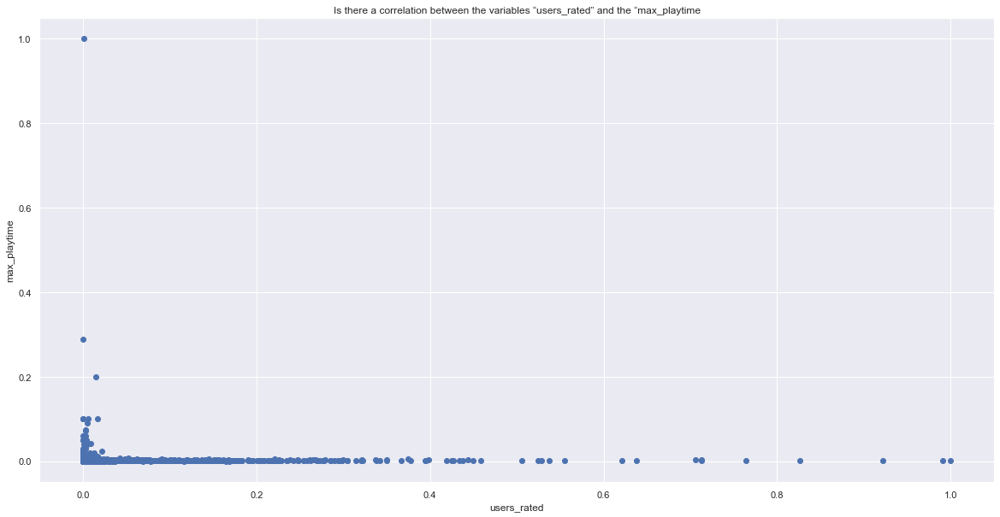

In [38]:
fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(df2["users_rated"],df2["max_playtime"])
ax.set_xlabel("users_rated")
ax.set_ylabel("max_playtime")
plt.title("Is there a correlation between the variables “users_rated” and the “max_playtime")
plt.show()

## Correlation Analysis between 1) users_rated and 2) max_playtime conclusion

>Correlation analysis between two variables, 1) users_rated and 2) max_playtime. 

>Causation explicitly applies to cases where action A causes outcome B. On the other hand, correlation is simply a relationship. Action A relates to Action B—but one event doesn’t necessarily cause the other event to happen (Madhavan, 2019).
If you do not confirm causality it can lead to a false positive result, where you believe an underlying relationship exists but in fact it isn’t there. This can be very problematic. 

>In the results obtained from our correlation analysis, it is clear there is no correlation between the two variables. The more users that rate the game has no affect on max playing time. However from the above results it is unclear and further tests must be carried out to see exactly if thats the case.


Text(0.5, 1.0, 'Is there a correlation between the variables “users_rated” and the “max_playtime')

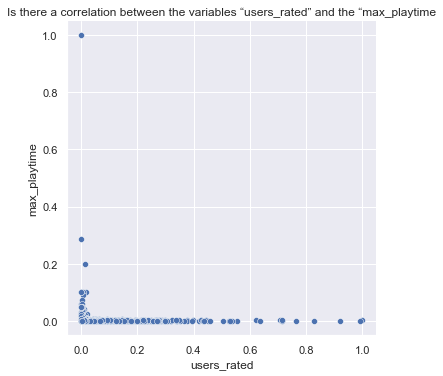

In [39]:
sns.relplot(x="users_rated",y="max_playtime",data=df2)
plt.title("Is there a correlation between the variables “users_rated” and the “max_playtime")

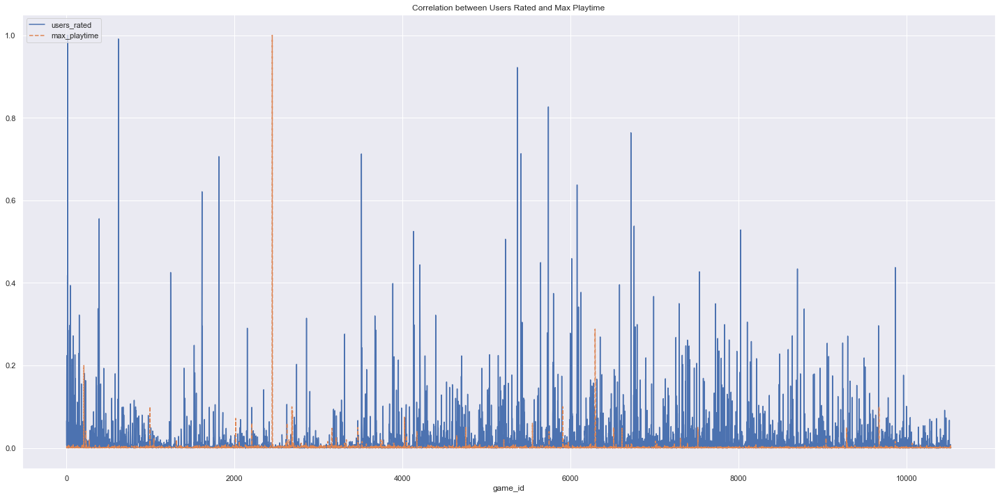

In [40]:
plt.xlabel("game_id")
plt.title("Correlation between Users Rated and Max Playtime")
df2["users_rated"].plot(style="-")
df2["max_playtime"].plot(style="--")
plt.legend(["users_rated","max_playtime"],loc="upper left")

# > C) What is the distribution of game categories? 


In [41]:
len(df2)

7151

In [42]:
df2.category.unique()

array(['Economic,Negotiation,Political', 'Card Game,Fantasy',
       'Abstract Strategy,Medieval', ..., 'Bluffing,Deduction,Dice',
       'Fantasy,Fighting,Miniatures,Sports',
       'Bluffing,Horror,Maze,Movies / TV / Radio theme,Science Fiction'],
      dtype=object)

In [43]:
len(df2.category.unique())

2919

In [44]:
df2.category.value_counts()

Wargame,World War II                                                                                                                                                             349
Card Game                                                                                                                                                                        297
Abstract Strategy                                                                                                                                                                124
Napoleonic,Wargame                                                                                                                                                               114
Card Game,Fantasy                                                                                                                                                                 86
Economic                                                                                       

In [45]:
df3 = df2.category.value_counts().to_frame().reset_index()
df3.head()

,index,category
0,"Wargame,World War II",349
1,Card Game,297
2,Abstract Strategy,124
3,"Napoleonic,Wargame",114
4,"Card Game,Fantasy",86


# 1.D) Do older games (1992 and earlier) have a higher MEAN “average rating” than newer games (after 1992)?

> Here I am going to use the .loc function to firstly gather the data from 1992/older and then secondly to gather the data from 1993/newer.

In [46]:
df2.loc[df2.year_published <=1992]

,game_id,description,max_players,max_playtime,min_age,min_players,min_playtime,name,playing_time,year_published,category,mechanic,publisher,average_rating,users_rated
0,0.000000,Die Macher is a game about seven sequential po...,0.013812,0.004000,0.56,3,0.004000,Die Macher,0.004000,1986,"Economic,Negotiation,Political","Area Control / Area Influence,Auction/Bidding,...","Hans im Glück Verlags-GmbH,Moskito Spiele,Vall...",7.66508,0.065794
1,0.000005,Dragonmaster is a trick-taking card game based...,0.011050,0.000500,0.48,3,0.000500,Dragonmaster,0.000500,1981,"Card Game,Fantasy",Trick-taking,"E.S. Lowe,Milton Bradley",6.60815,0.006331
4,0.000018,"In Acquire, each player strategically invests ...",0.016575,0.001500,0.48,3,0.001500,Acquire,0.001500,1964,Economic,"Hand Management,Stock Holding,Tile Placement","3M,Avalon Hill,Avalon Hill (Hasbro),Dujardin,G...",7.35830,0.224022
5,0.000023,"In the ancient lands along the Mediterranean, ...",0.016575,0.004000,0.48,2,0.004000,Mare Mediterraneum,0.004000,1989,"Civilization,Nautical",Dice Rolling,Historien Spiele Galerie (Historien Spielegale...,6.52534,0.000340
6,0.000028,"In Cathedral, each player has a set of pieces ...",0.005525,0.000333,0.32,2,0.000333,Cathedral,0.000333,1978,Abstract Strategy,"Area Enclosure,Pattern Building,Pattern Recogn...","Brightway Products Ltd,Falomir Juegos,Family G...",6.50534,0.039953
14,0.000065,"By request of Fantasy Flight Games, Board Game...",0.016575,0.001500,0.48,2,0.001500,Cosmic Encounter,0.001500,1977,"Bluffing,Negotiation,Science Fiction","Hand Management,Variable Player Powers","Alga,ASS Altenburger Spielkarten,Descartes Edi...",6.93470,0.052940
18,0.000083,"A long time ago, in a village far, far away, s...",0.011050,0.000750,0.36,2,0.000500,Wacky Wacky West,0.000750,1991,"American West,Bluffing,City Building","Tile Placement,Voting","Hans im Glück Verlags-GmbH,Mayfair Games",6.31166,0.020842
19,0.000088,"In this game of science fiction strip mining, ...",0.011050,0.001500,0.48,2,0.001500,Full Metal Planète,0.001500,1988,Science Fiction,Action Point Allowance System,Ludodélire,7.43592,0.008165
20,0.000097,From the 2nd edition rulebook intro for MAGIC ...,0.044199,0.004000,0.48,1,0.004000,Magic Realm,0.004000,1979,"Adventure,Exploration,Fantasy","Action / Movement Programming,Modular Board,Ro...","(Self-Published),Avalon Hill",7.14384,0.024540
21,0.000102,Classic game of fantasy empires clashing. Eac...,0.016575,0.006000,0.48,2,0.006000,Divine Right,0.006000,1979,"Fantasy,Political,Wargame","Dice Rolling,Hex-and-Counter,Variable Phase Order","Right Stuf,TSR",6.95654,0.006405


In [47]:
df2.loc[df2.year_published >1992]

,game_id,description,max_players,max_playtime,min_age,min_players,min_playtime,name,playing_time,year_published,category,mechanic,publisher,average_rating,users_rated
2,0.000009,"Part of the Knizia tile-laying trilogy, Samura...",0.011050,0.001000,0.40,2,0.000500,Samurai,0.001000,1998,"Abstract Strategy,Medieval","Area Control / Area Influence,Hand Management,...","999 Games,ABACUSSPIELE,Astrel Games,Ceilikan J...",7.44119,0.177043
7,0.000032,"In this interesting offering from Warfrog, pla...",0.013812,0.002000,0.48,2,0.002000,Lords of Creation,0.002000,1993,"Civilization,Fantasy",Modular Board,"Vendetta,Warfrog Games",6.14538,0.002012
8,0.000037,"Although referred to as a sequel to El Grande,...",0.011050,0.001500,0.52,2,0.001500,El Caballero,0.001500,1998,Exploration,"Area Control / Area Influence,Tile Placement","999 Games,Hans im Glück Verlags-GmbH,Rio Grand...",6.51776,0.017942
9,0.000042,Elfenland is a redesign of the original White ...,0.016575,0.001000,0.40,2,0.001000,Elfenland,0.001000,1998,"Fantasy,Travel","Card Drafting,Hand Management,Point to Point M...","999 Games,AMIGO Spiel + Freizeit GmbH,Corfix,H...",6.74996,0.098794
10,0.000046,Bohnanza is the first in the Bohnanza family o...,0.019337,0.000750,0.52,2,0.000750,Bohnanza,0.000750,1997,"Card Game,Farming,Negotiation","Hand Management,Set Collection,Trading","AMIGO Spiel + Freizeit GmbH,999 Games,Brain Ga...",7.06751,0.418667
11,0.000051,Ra is an auction and set-collection game with ...,0.013812,0.001000,0.48,2,0.000750,Ra,0.001000,1999,"Ancient,Mythology","Auction/Bidding,Press Your Luck,Set Collection","alea,Ravensburger Spieleverlag GmbH,999 Games,...",7.47505,0.226729
12,0.000055,"In Catan (formerly The Settlers of Catan), pla...",0.011050,0.002000,0.40,3,0.001000,Catan,0.002000,1995,Negotiation,"Dice Rolling,Hand Management,Modular Board,Rou...","KOSMOS,999 Games,Albi,Astrel Games,Bergsala En...",7.26569,1.000000
13,0.000060,Basari is a game of gem merchants competing in...,0.011050,0.000417,0.40,3,0.000417,Basari,0.000417,1998,Negotiation,"Roll / Spin and Move,Set Collection,Simultaneo...","F.X. Schmid,New Games Order, LLC,Out of the Bo...",6.78156,0.021093
15,0.000069,Taking on the roles of shop owners in the Moro...,0.011050,0.001000,0.48,3,0.001000,MarraCash,0.001000,1996,Economic,Auction/Bidding,KOSMOS,6.84341,0.012233
16,0.000074,This game gained a quick following after one o...,0.005525,0.000083,0.40,2,0.000083,Button Men,0.000083,1999,"Collectible Components,Dice,Fighting,Print & Play","Dice Rolling,Press Your Luck","(Unknown),Atlas Games,Cheapass Games,Five Ring...",6.30870,0.009970


In [48]:
df_older_games = df2["year_published"] <= 1992

In [49]:
df_older_games1 = df2["year_published"] > 1992

In [50]:
average_less_than_equal = df2[df_older_games]["average_rating"].mean()
print(average_less_than_equal)

6.256531006523769


In [51]:
average_more_than = df2[df_older_games1]["average_rating"].mean()
print(average_more_than)

6.601738196775251


## Result of Study
>The mean is higher for games older than 1992 i.e. games from 1993 to 2016

>The below graphs will visually show this.

### Visual representation of mean from 1950 to 2016

Text(0.5, 1.0, 'The mean average rating of the data from 1950 to 2016')

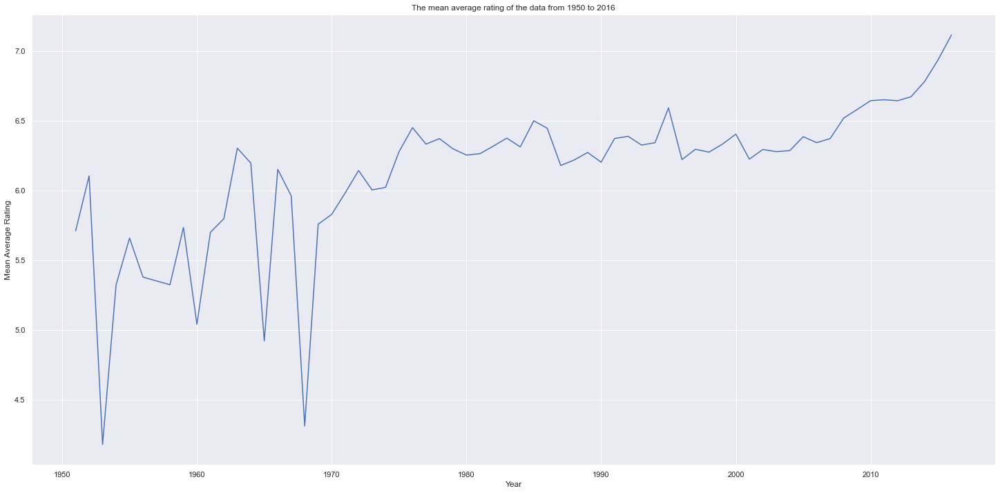

In [52]:
avg_game = df2.groupby('year_published')['average_rating'].agg('mean')
avg_game.plot()
plt.xlabel("Year")
plt.ylabel("Mean Average Rating")
plt.title("The mean average rating of the data from 1950 to 2016")

### Visual representation of the mean from 1950 to 1992

Text(0.5, 1.0, 'The mean average rating of the data from 1950 to 1992')

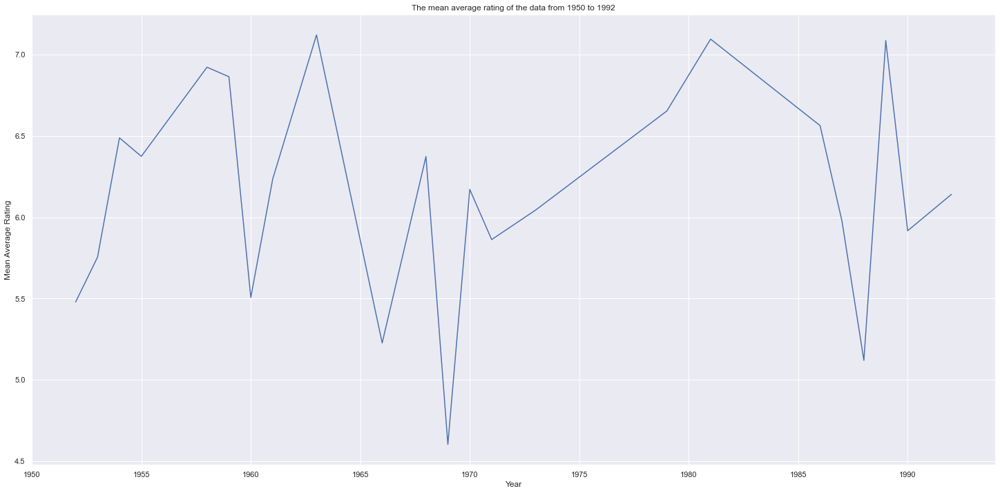

In [53]:
df_less_than_equal = df2.loc['1950':'1992']
df_less_than_equal['average_rating'].plot()
plt.xlabel("Year")
plt.ylabel("Mean Average Rating")
plt.title("The mean average rating of the data from 1950 to 1992")

### Visual representation of the mean from 1993 to 2016

Text(0.5, 1.0, 'The mean average rating of the data from 1993 to 2016')

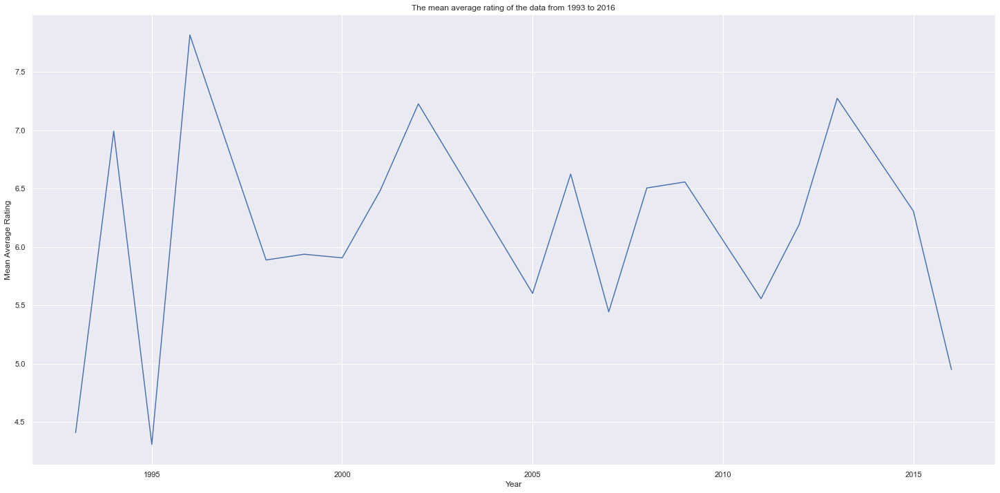

In [54]:
df_more_than = df2.loc['1993':'2016']
df_more_than['average_rating'].plot()
plt.xlabel("Year")
plt.ylabel("Mean Average Rating")
plt.title("The mean average rating of the data from 1993 to 2016")

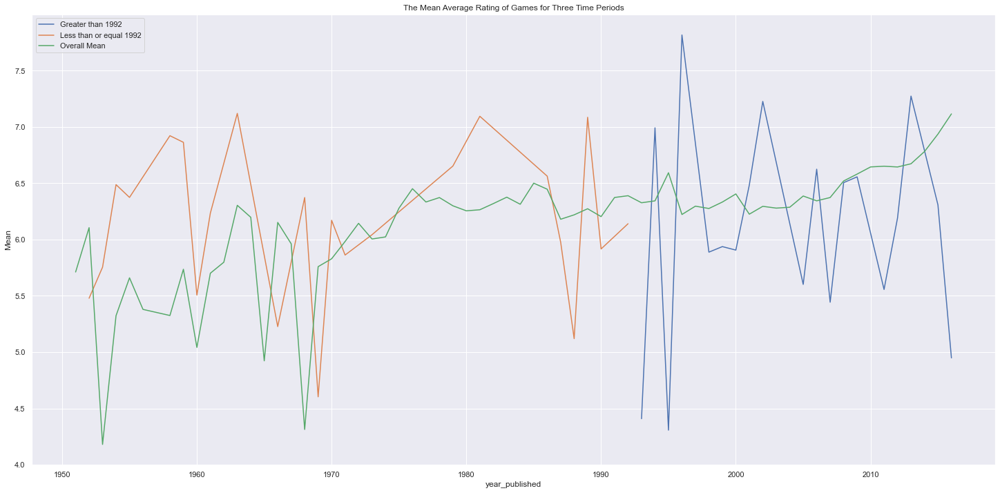

In [55]:
plt.title("The Mean Average Rating of Games for Three Time Periods")
plt.xlabel("Year Published")
plt.ylabel("Mean")
plt.linewidth= 30

df_more_than['average_rating'].plot()
df_less_than_equal['average_rating'].plot()
avg_game.plot()
plt.legend(["Greater than 1992","Less than or equal 1992","Overall Mean"],loc="upper left")

#  1.E)  What are the 3 most common “mechanics” in the dataset? 


In [56]:
trend = df2["mechanic"].mode()
print(trend)

0    Hex-and-Counter
dtype: object


In [57]:
df2['mechanic']. value_counts(). idxmax()

'Hex-and-Counter'

In [58]:
df2['mechanic'].value_counts()[0:3]

Hex-and-Counter    394
Hand Management    225
Dice Rolling       120
Name: mechanic, dtype: int64

<AxesSubplot:>

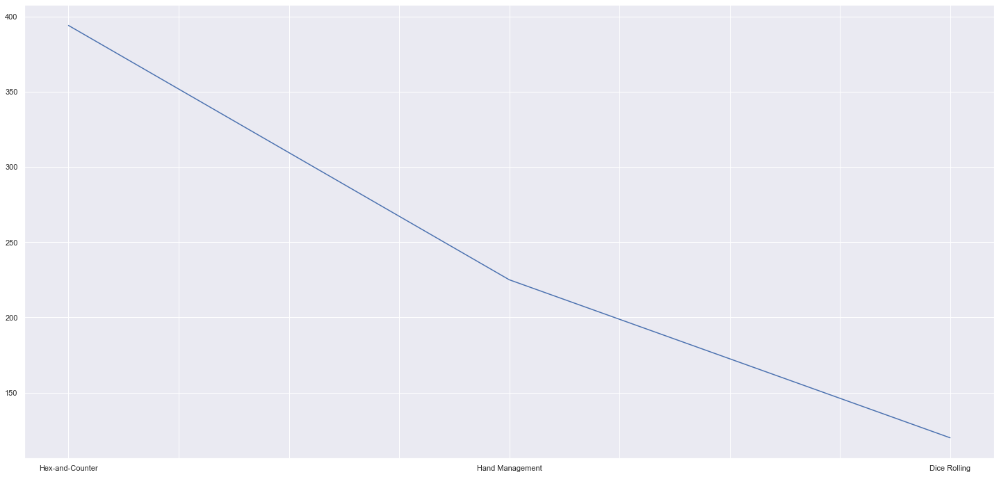

In [59]:
df2['mechanic'].value_counts()[0:3].plot()

# Part 2

## 2. Statistical Relevant Question - Research and Answer



>In this section I will carry out independent research in an area of my interest. The aim of this is to provide valuable insights to the company and help them with their sales strategy for the upcoming winter season. The area I have selected to focus on revolves around what is the target market to best target for board games.

>Thinking about Winter, lots of things come to mind such as the weather but ultimately Christmas is the pinnacle of every Winter season and additionally the purchase of toys and the gifting of presents. Furthermore, Santa comes to mind to the kids from the years of 12 and below.

>In my analysis I have decided to target the children’s market to sell board games to. I took the key variables that I felt were important to have and housed them in a new dataframe. I furthermore carried out the below steps to help uncover an insight. I will provide a large-scale synopsis of the results at the end of these steps. 


#### New Dataframe
>Below I singled out the variables I wished to focus on, this helps my graphs and keeps things neat and tidy.

In [60]:
new_df = df_1[['year_published','name', 'min_age', 'min_players', 'users_rated', 'min_playtime', 'average_rating']]
new_df.head()

,year_published,name,min_age,min_players,users_rated,min_playtime,average_rating
0,1986,Die Macher,14,3,4498,240,7.66508
1,1981,Dragonmaster,12,3,478,30,6.60815
2,1998,Samurai,10,2,12019,30,7.44119
4,1964,Acquire,12,3,15195,90,7.35830
5,1989,Mare Mediterraneum,12,2,73,240,6.52534


>Checking the data with new_df.info() to make sure everything is okay from the previous steps in data cleaning and feature engineering

In [61]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7151 entries, 0 to 10531
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   year_published  7151 non-null   int64  
 1   name            7151 non-null   object 
 2   min_age         7151 non-null   int64  
 3   min_players     7151 non-null   int64  
 4   users_rated     7151 non-null   int64  
 5   min_playtime    7151 non-null   int64  
 6   average_rating  7151 non-null   float64
dtypes: float64(1), int64(5), object(1)
memory usage: 446.9+ KB


#### Examining Minimum Playtime Graphically
>In the below graph it is clear to see there is an outlier in the data which is circa 1980. Other than that the insight gained from this graph is that the minimum playing time of board games has slowly decreased in time over the years and is still decreasing in the latest year of the data, which is 2016.

<Figure size 1440x720 with 0 Axes>

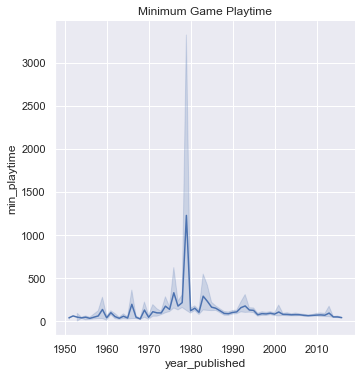

In [62]:
plt.figure(figsize=(20,10))

g = sns.relplot(x="year_published", y="min_playtime", kind="line", data=new_df)
plt.title("Minimum Game Playtime")
plt.show()

#### Examining Minimum Players Graphically
>The minimum players is also decreasing over time

<Figure size 1440x720 with 0 Axes>

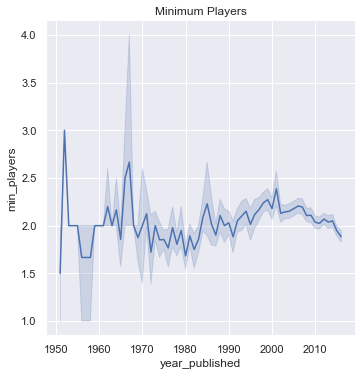

In [63]:
plt.figure(figsize=(20,10))

g = sns.relplot(x="year_published", y="min_players", kind="line", data=new_df)
plt.title("Minimum Players")
plt.show()

#### Examining Minimum Age Graphically
>The minimum age has gone up and down over the years and is on the rise according to the latest year of the data, which is 2016.

>A relplot was used which is very exact and nicely represents the data.

<Figure size 1440x720 with 0 Axes>

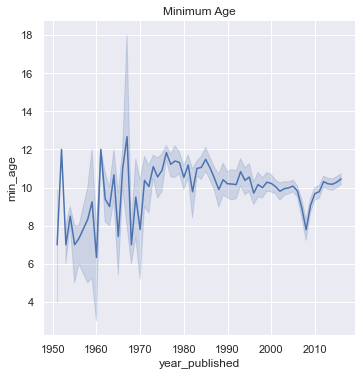

In [64]:
plt.figure(figsize=(20,10))

g = sns.relplot(x="year_published", y="min_age", kind="line", data=new_df)
plt.title("Minimum Age")
plt.show()

### Narrowing the Focus
>I wanted to obtain the board games for children under the age 13, so that is why I used this code

In [65]:
df_young = new_df.loc[new_df.min_age <=12]
df_young.head()

,year_published,name,min_age,min_players,users_rated,min_playtime,average_rating
1,1981,Dragonmaster,12,3,478,30,6.60815
2,1998,Samurai,10,2,12019,30,7.44119
4,1964,Acquire,12,3,15195,90,7.35830
5,1989,Mare Mediterraneum,12,2,73,240,6.52534
6,1978,Cathedral,8,2,2751,20,6.50534


>Ascertaning the board games that require less than 3 players

In [66]:
df_min_players = df_young.loc[df_young.min_players <3]
df_min_players.head()

,year_published,name,min_age,min_players,users_rated,min_playtime,average_rating
2,1998,Samurai,10,2,12019,30,7.44119
5,1989,Mare Mediterraneum,12,2,73,240,6.52534
6,1978,Cathedral,8,2,2751,20,6.50534
7,1993,Lords of Creation,12,2,186,120,6.14538
9,1998,Elfenland,10,2,6729,60,6.74996


>Performing descriptive statistics on the data in the new dataframe

In [67]:
num_df = df_min_players[['min_age', 'min_players', 'users_rated', 'min_playtime']]
num_df.describe()

,min_age,min_players,users_rated,min_playtime
count,5058.000000,5058.000000,5058.000000,5058.000000
mean,9.252867,1.852313,1043.681495,84.024911
std,3.149168,0.360354,3313.126277,300.686652
min,0.000000,0.000000,50.000000,0.000000
25%,8.000000,2.000000,96.000000,25.000000
50%,10.000000,2.000000,217.000000,45.000000
75%,12.000000,2.000000,675.000000,90.000000
max,12.000000,2.000000,67056.000000,17280.000000


>Gathering the data where the minimum playing time on board games is less than or equal to 30 mins.

In [68]:
df_ave_playtime = df_min_players.loc[df_min_players.min_playtime <=30]
df_ave_playtime.head()

,year_published,name,min_age,min_players,users_rated,min_playtime,average_rating
2,1998,Samurai,10,2,12019,30,7.44119
6,1978,Cathedral,8,2,2751,20,6.50534
16,1999,Button Men,10,2,724,5,6.30870
18,1991,Wacky Wacky West,9,2,1459,30,6.31166
37,1980,Can't Stop,9,2,9095,30,6.85659


>Next I am selecting board games past the year 1999

In [69]:
df_ave_playtime.loc[df_ave_playtime.year_published >=2000]




,year_published,name,min_age,min_players,users_rated,min_playtime,average_rating
388,2000,Citadels,10,2,37607,20,7.14768
426,2000,Labyrinth: The Card Game,7,2,1041,30,5.53712
444,2000,7 Safari,8,2,92,20,5.38043
495,2000,River Dragons,8,2,2499,30,6.46149
498,2000,Hera and Zeus,12,2,3021,30,6.52656
502,2000,Shipwrecked,12,2,408,30,5.69112
578,2000,Battle Line,12,2,12222,30,7.42393
614,2000,Chrononauts,11,1,4590,30,6.22636
617,2000,Carcassonne,8,2,67056,30,7.43536
649,2000,Bongo!,8,2,436,15,6.10071


In [70]:
df_select = df_ave_playtime.value_counts()[0:20]

In [71]:
selection_df = pd.DataFrame(df_select, columns=['count']).reset_index()
selection_df.head(20)

,year_published,name,min_age,min_players,users_rated,min_playtime,average_rating,count
0,2016,Zany Penguins,7,2,501,20,6.78864,1
1,2006,Megastar,8,2,434,30,5.47839,1
2,2006,On the Dot,10,2,429,5,6.24930,1
3,2006,NHL Ice Breaker: The Card Hockey Board Game,8,1,250,25,6.30720,1
4,2006,Mr. Jack,9,2,11800,30,7.08759,1
5,2006,Mother Sheep,8,2,146,20,5.43808,1
6,2006,MixUp,8,2,105,20,6.32067,1
7,2006,Mimic,8,1,91,30,6.28022,1
8,2006,Medici vs Strozzi,10,2,1546,30,6.53156,1
9,2006,Pieces of Eight,10,2,118,10,5.76356,1


In [72]:
top_board_games = selection_df.groupby(['name'])['users_rated'].sum().sort_values(ascending=False)
top_board_games = top_board_games.to_frame().reset_index()
top_board_games

,name,users_rated
0,Mr. Jack,11800
1,Mag·Blast (Third Edition),1776
2,Medici vs Strozzi,1546
3,Pictureka!,707
4,Zany Penguins,501
5,Megastar,434
6,On the Dot,429
7,Los Mampfos,323
8,NHL Ice Breaker: The Card Hockey Board Game,250
9,Jungle Treasure,177


> The barplot was used to keep the results clean and show exactly which game was best rated and the one that I would definitely advise be stocked in the shops for the Winter.

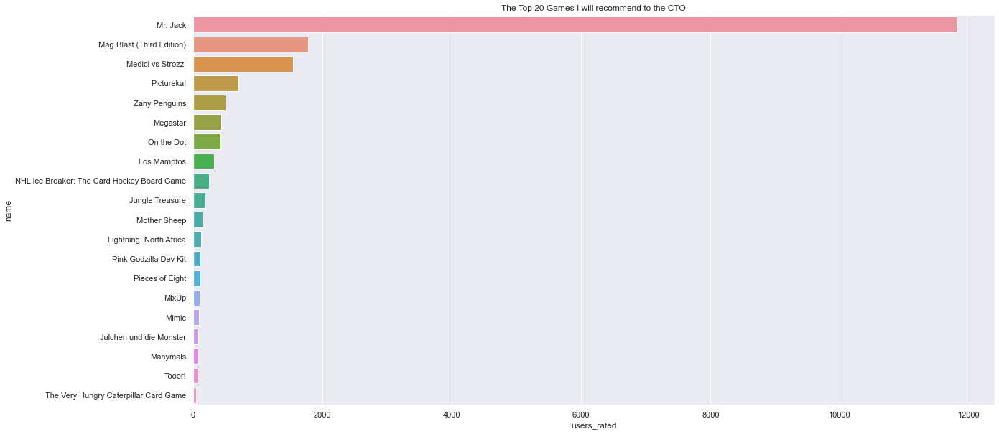

In [73]:
plt.figure(figsize=(20,10))
sns.barplot(x='users_rated',y='name', data=top_board_games)
plt.title("The Top 20 Games I will recommend to the CTO")
plt.show()

### Overall Findings

>One of the most common questions about board games is: “How long does the game take to play?”
(The Board Game Family, 2021) According to this dedicated webpage, 30 minutes represents the ideal amount of time to play a board game. Nowadays, our attention spans are lower and we are always on the go and haven’t much time to spend, therefore playing a board game in a short space of time is the ideal scenario.

>This drove my research as parents buying their kids board games understand that they will end up playing the game with them. That is why I chose to identify the games that take less than 30 minutes to play, can be played with two players or less and finally is ranked based on the users rated. Therefore the most users that use these games indicate to me that these games are quite popular and well known and so will not take much money to advertise their name. In essence that is my strategy to the sales department and the top 20 games I would stock in the shops are shown above.


# Part 3

>Throughout the code and markdown is where I have addressed the questions to Part 3.

# References

>  Bonaccorso, G., 2017. Machine Learning Algorithms. Birmingham: Packt Publishing.


>  Lesmeister, C., 2015. Mastering Machine Learning with R.. Birmingham: Packt.


>  Madhavan, A., 2019. Amplitude. [Online] 
   Available at: https://amplitude.com/blog/causation-correlation
  [Accessed 20th October 2021].


>  Octopai, 2019. Octopai. [Online] 
   Available at: https://www.octopai.com/automatic-data-dictionary-mapping-using-machine-learning/
   [Accessed 27th October 2021].


>  Vallat, R., 2019. raphaelvallat.com. [Online] 
   Available at: https://raphaelvallat.com/correlation.html
   [Accessed 28th October 2021].
   
>  The Board Game Family, 2021. The Board Game Family. [Online] 
   Available at: https://www.theboardgamefamily.com/2012/01/the-best-game-length/
   [Accessed 29th 0ctober 2021].


